In [211]:
import cv2
import glob
from IPython.display import HTML
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
from moviepy.editor import VideoFileClip
import numpy as np
import os

## Camera calibration

In [212]:
objpoints = []
imgpoints = []

chessboard_shape = (9, 6)
objp = np.zeros((chessboard_shape[0]*chessboard_shape[1], 3), np.float32)
objp[:,:2] = np.mgrid[0:chessboard_shape[0], 0:chessboard_shape[1]].T.reshape(-1, 2)

for filename in glob.glob('./camera_cal/*.jpg'):    
    img = mpimg.imread(filename)
    
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, chessboard_shape, None)
    
    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)

ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

In [278]:
def plot_img(img_1, img_1_title, figsize=(8, 4)):
    """Plot a single image
    
    Parameters:
        img_1 (numpy.array): numpy array representation of the first image
        img_1_title (str): title of the first image 
        figsize (tuple of integers, optional): size of the plot, default: (20, 10)
        
    Returns:
        None
    """
    fig, ax1 = plt.subplots(1, 1, figsize=figsize)
    fig.tight_layout()

    ax1.imshow(img_1)
    ax1.set_title(img_1_title)

def plot_imgs(img_1, img_1_title, img_2, img_2_title, figsize=(20, 10), image_1_cmap=None, image_2_cmap=None):
    """Plot two images 
    
    Parameters:
        img_1 (numpy.array): numpy array representation of the first image
        img_1_title (str): title of the first image 
        img_2 (numpy.array): numpy array representation of the second image 
        img_2_title (str): title of the second image
        figsize (tuple of integers, optional): size of the plot, default: (20, 10)
        image_1_cmp (str, optional): color map for image 1
        image_2_cmp (str, optional): color map for image 2
    Returns:
        None
    """
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)
    fig.tight_layout()

    ax1.imshow(img_1, cmap=image_1_cmap)
    ax1.set_title(img_1_title)

    ax2.imshow(img_2, cmap=image_2_cmap)
    ax2.set_title(img_2_title)

def plot_and_save_img(img, title, outfile_name, path='./output_images', figsize=(8, 4)):
    """Save a single image
    
    Parameters:
        img (numpy.array): numpy array representation of the first image
        title (str): title of the first image 
        outfile_name (str): filename
        path (str, optional): location to save image
        figsize (tuple of integers, optional): size of the plot, default: (20, 10)
        
    Returns:
        None
    """
    fig, ax1 = plt.subplots(1, 1, figsize=figsize)
    fig.tight_layout()

    ax1.imshow(img)
    ax1.set_title(title)
    plt.savefig('{}/{}'.format(path, outfile_name))
    
def plot_and_save_imgs(img_1, img_1_title, img_2, img_2_title, outfile_name, path='./output_images', figsize=(20, 10), image_1_cmap=None, image_2_cmap=None):
    """Save two images one a single plot
    
    Parameters:
        img_1 (numpy.array): numpy array representation of the first image
        img_1_title (str): title of the first image 
        img_2 (numpy.array): numpy array representation of the second image 
        img_2_title (str): title of the second image
        outfile_name (str): filename
        path (str, optional): location to save file
        figsize (tuple of integers, optional): size of the plot, default: (20, 10)
        image_1_cmp (str, optional): color map for image 1
        image_2_cmp (str, optional): color map for image 2
    Returns:
        None
    """
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)
    fig.tight_layout()

    ax1.imshow(img_1, cmap=image_1_cmap)
    ax1.set_title(img_1_title)

    ax2.imshow(img_2, cmap=image_2_cmap)
    ax2.set_title(img_2_title)
    plt.savefig('{}/{}'.format(path, outfile_name))

## Experiment with image layers 

In [279]:
test_img = mpimg.imread('test_images/test5.jpg')

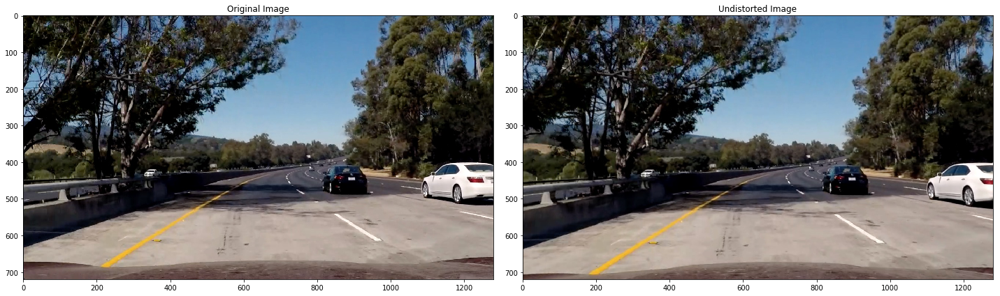

In [280]:
# Visualize distortion correction to raw images.
distortion_corrected_img = cv2.undistort(test_img, mtx, dist, None, mtx)
plot_and_save_imgs(test_img, "Original Image", distortion_corrected_img, "Undistorted Image", "undistorted")

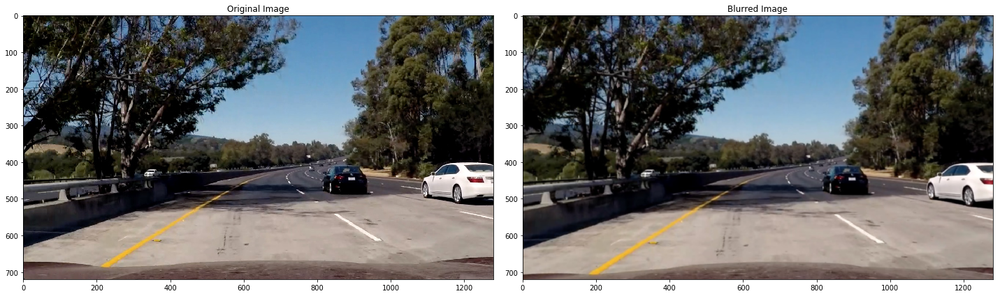

In [282]:
# Blur the image
blurred_img = cv2.GaussianBlur(distortion_corrected_img, (5,5), 0)
plot_and_save_imgs(test_img, "Original Image", blurred_img, "Blurred Image", "blurred")

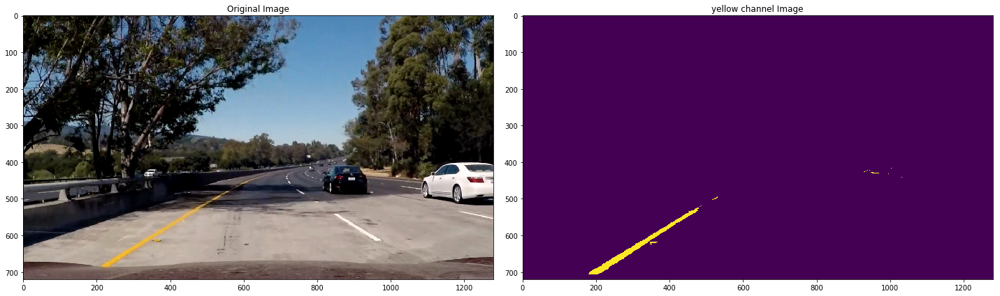

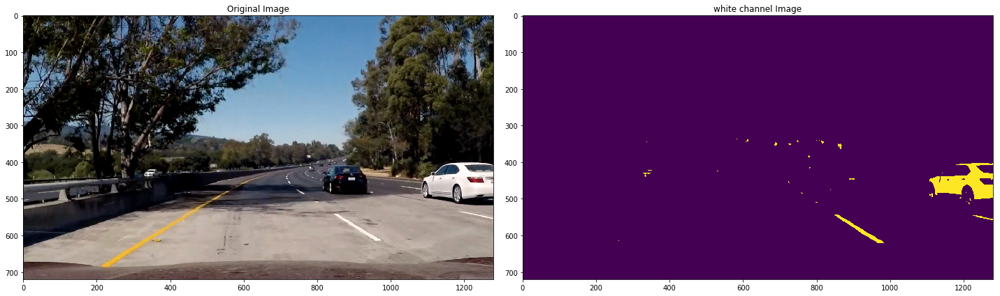

In [284]:
colors = {
    'yellow': {
        'min': np.array([150, 150, 0]),
        'max': np.array([255, 255, 120])
    },
    'white': {
        'min': np.array([185, 185, 185]),
        'max': np.array([255, 255, 255])
    }
}

for color in colors:
    img_title = "{} channel Image".format(color)
    output_filename = "{}_channel".format(color)
    color_thresh_img = cv2.inRange(blurred_img, colors[color]['min'], colors[color]['max'])
    plot_and_save_imgs(test_img, "Original Image", color_thresh_img, img_title, output_filename)

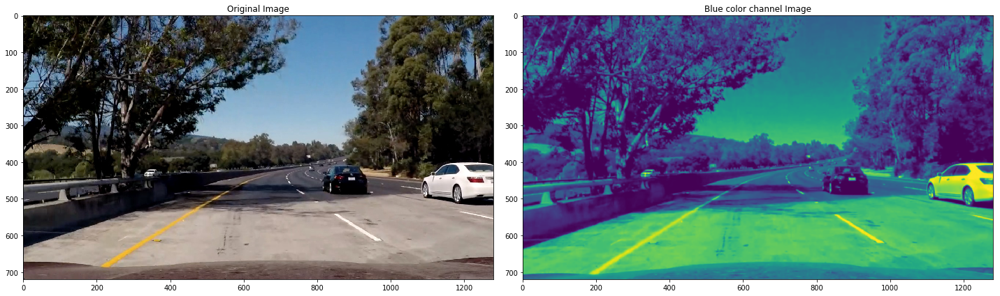

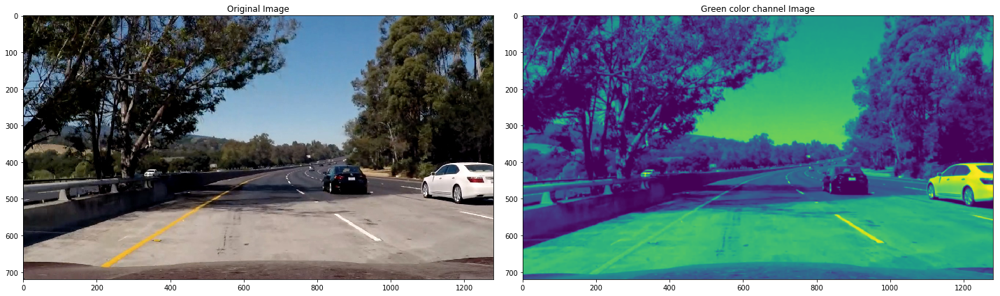

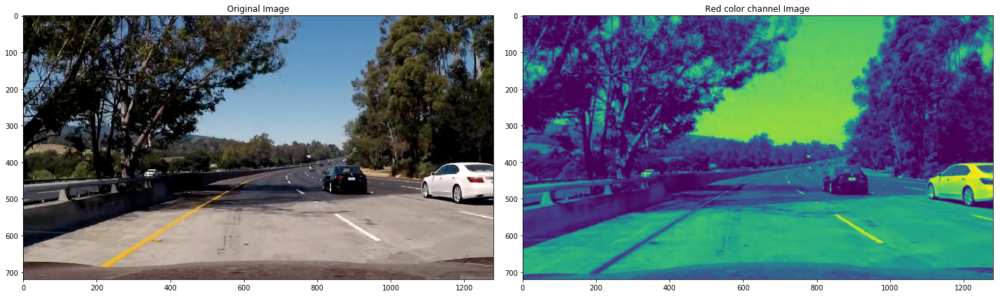

In [287]:
# Visualize BGR color channels
bgr_channel_map = ['Blue', 'Green', 'Red']
for channel in range(len(bgr_channel_map)):
    img_title = "{} color channel Image".format(bgr_channel_map[channel])
    output_filename = "{}_channel".format(bgr_channel_map[channel])
    plot_and_save_imgs(test_img, "Original Image", blurred_img[:,:,channel], img_title, output_filename)

We are best able to see the lane lines in the blue color channel (BGR), so we will eventually use this channel for filtering.

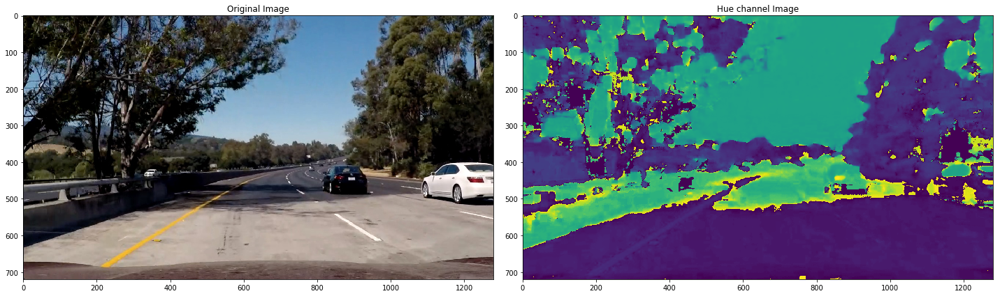

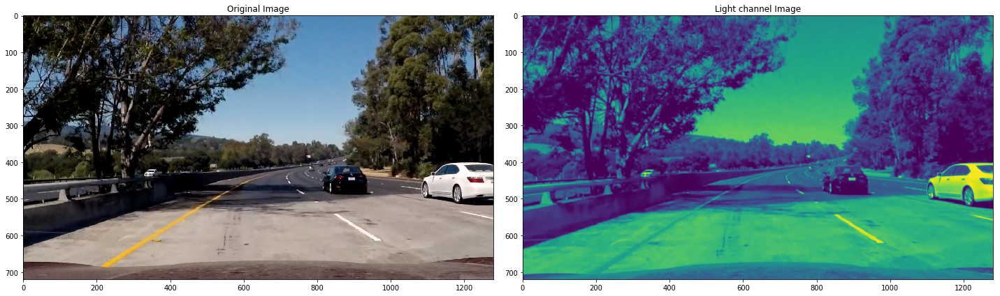

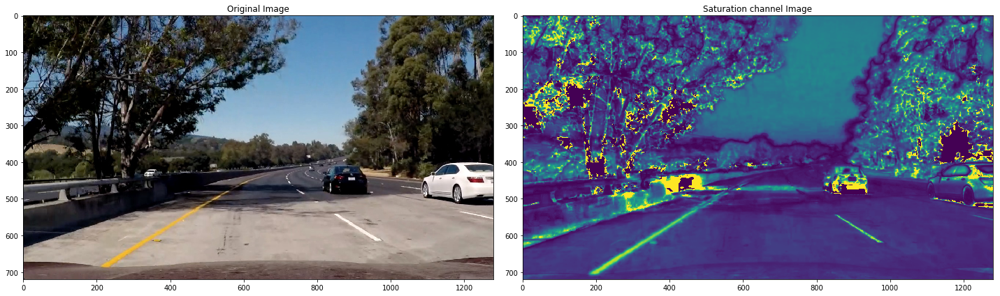

In [292]:
# Visualize HLS color channels
hls_img = cv2.cvtColor(blurred_img, cv2.COLOR_RGB2HLS)
hls_channel_map = ['Hue', 'Light', 'Saturation']
for channel in range(len(hls_channel_map)):
    img_title = "{} channel Image".format(hls_channel_map[channel])
    output_filename = "hls_{}_channel".format(hls_channel_map[channel])
    plot_and_save_imgs(test_img, "Original Image", hls_img[:,:,channel], img_title, output_filename)

We are best able to see the lane lines in the saturation channel, so we will eventually use this channel for filtering.

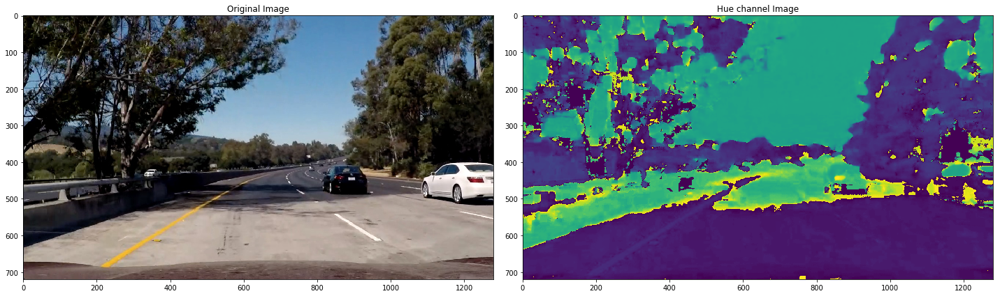

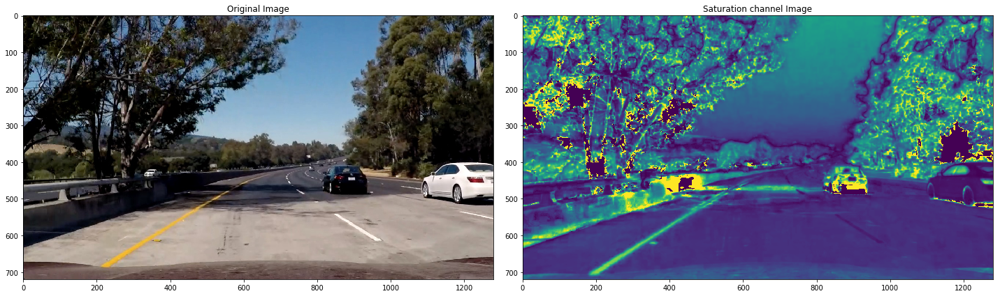

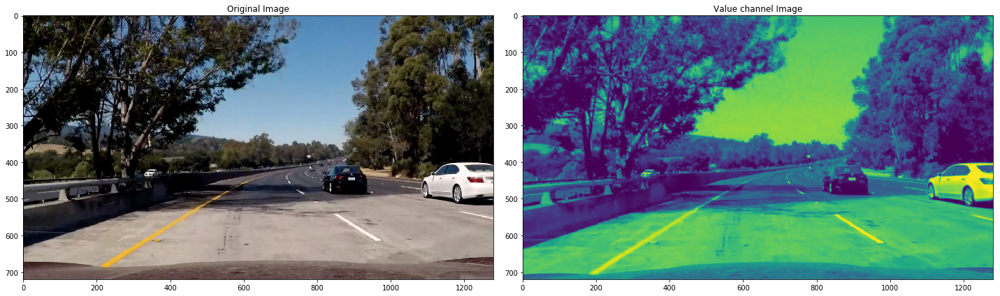

In [291]:
# Visualize HSV color channels
hsv_img = cv2.cvtColor(blurred_img, cv2.COLOR_RGB2HSV)
hsv_channel_map = ['Hue', 'Saturation', 'Value']
for channel in range(len(hsv_channel_map)):
    img_title = "{} channel Image".format(hsv_channel_map[channel])
    output_filename = "hsv_{}_channel".format(hsv_channel_map[channel])
    plot_and_save_imgs(test_img, "Original Image", hsv_img[:,:,channel], img_title, output_filename)

We are best able to see the dashed lane lines in the value channel, so we will eventually use this channel for filtering.

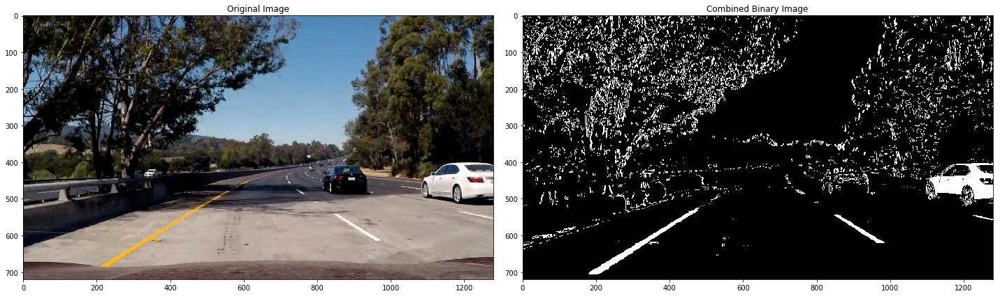

In [319]:
# Check out the combined binaries

saturation_threshold = (180, 200)
sobel_x_threshold = (40, 100)
value_treshold = (200, 215)

# Isolate the blue channel for sobel filtering, so the yellow line is easily detected
color_channel = blurred_img[:,:,2]

# Convert to HLS color space and isolate the saturation channel
hls_channel = cv2.cvtColor(blurred_img, cv2.COLOR_RGB2HLS)[:,:,2]

# Convert to HVS color space and isolate the light channel
hsv_channel = cv2.cvtColor(blurred_img, cv2.COLOR_RGB2HSV)[:,:,1]

# Isolate the yellow color values
yellow_mask = cv2.inRange(blurred_img, np.array([150, 150, 0]), np.array([255, 255, 120]))

# Isolate the white color values
white_mask = cv2.inRange(blurred_img, np.array([185, 185, 185]), np.array([255, 255, 255]))

# Apply Sobel x filtering on the blue color channel
sobelx = cv2.Sobel(color_channel, cv2.CV_64F, 1, 0) 
abs_sobelx = np.absolute(sobelx)
scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

# Apply the threshold on the x gradient
sxbinary = np.zeros_like(scaled_sobel)
sxbinary[(scaled_sobel >= sobel_x_threshold[0]) & (scaled_sobel <= sobel_x_threshold[1])] = 1

# Apply the threshold on the hls saturation channel
hls_s_binary = np.zeros_like(hls_channel)
hls_s_binary[(hls_channel >= saturation_threshold[0]) & (hls_channel <= saturation_threshold[1])] = 1

# Apply the threshold on the hsv saturation channel
hsv_v_binary = np.zeros_like(hsv_channel)
hsv_v_binary[(hsv_channel >= value_treshold[0]) & (hsv_channel <= value_treshold[1])] = 1

# Apply the threshold on the yellow mask
yellow_binary = (yellow_mask // 255).astype(np.uint8)

# Apply the threshold on the white mask
white_binary = (white_mask // 255).astype(np.uint8)

combined_binary = np.zeros_like(sxbinary)
combined_binary[(hls_s_binary == 1) | (sxbinary == 1) | (hsv_v_binary == 1) | (yellow_binary == 1) | (white_binary == 1)] = 1

plot_and_save_imgs(test_img, "Original Image", combined_binary, "Combined Binary Image", "combined_inary", image_2_cmap="gray")

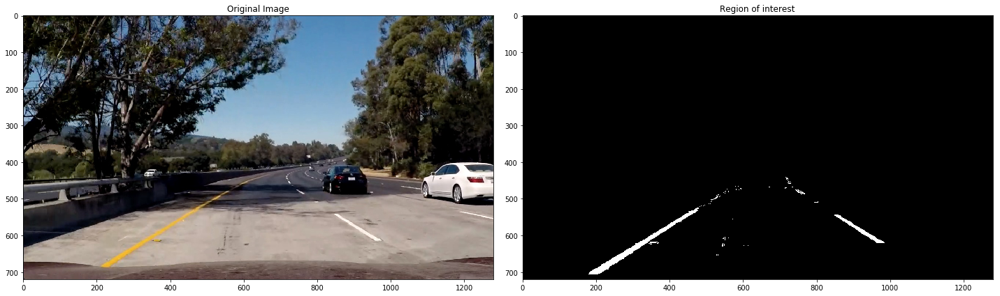

In [320]:
# Find region of interest
vertices = np.array([[130, combined_binary.shape[0]], 
                     [625, combined_binary.shape[0]*0.6], 
                     [700, combined_binary.shape[0]*0.6], 
                     [1200, combined_binary.shape[0]]], np.int32)

#defining a blank mask to start with
mask = np.zeros_like(combined_binary)   
ignore_mask_color = (255,)

#filling pixels inside the polygon defined by "vertices" with the fill color    
cv2.fillPoly(mask, 
             np.int32([vertices]), 
             ignore_mask_color)

#returning the image only where mask pixels are nonzero
masked_image = cv2.bitwise_and(combined_binary, mask)

plot_imgs(test_img, "Original Image", masked_image, "Region of interest", image_2_cmap="gray")

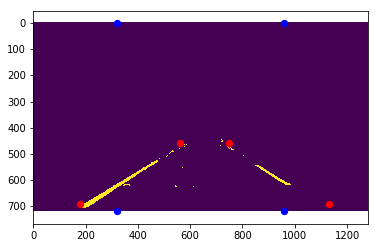

In [321]:
# Figure out perspective transform
plt.imshow(masked_image)
plt.scatter(x=[560, 180, 1130, 750], y=[460, 690, 690, 460], c='r', s=40)
plt.scatter(x=[320, 320, 960, 960], y=[0, 720, 720, 0], c='b', s=40)
plt.savefig('./output_images/p_transform_points')

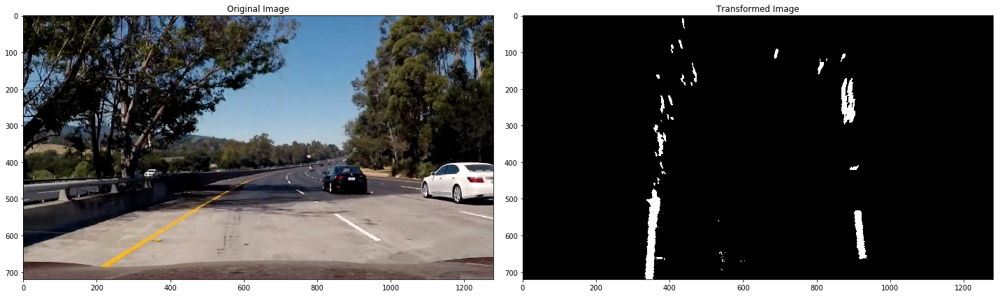

In [322]:
# hard coded from experimentation above
src = np.float32([[560,460],[180,690],[1130,690],[750,460]])
dst = np.float32([[320,0],[320,720],[960,720],[960,0]])

M = cv2.getPerspectiveTransform(src, dst)
Minv = cv2.getPerspectiveTransform(dst, src)

transformed_img = cv2.warpPerspective(masked_image, M, (img.shape[1], img.shape[0]), flags=cv2.INTER_LINEAR)
plot_imgs(test_img, "Original Image", transformed_img, "Transformed Image", image_2_cmap="gray")

## Detect lanes in single images

In [323]:
def blur_image(img, kernel_size=(5,5)):
    """Blur an image with Gaussian filtering
    
    Parameters:
        img (numpy.array): numpy array representation of an image
        kernel_size (tuple of integers): Gaussian kernel size (width, height)
        
    Returns:
        numpy array representation of the filtered image
    """
    
    return cv2.GaussianBlur(img, kernel_size, 0)

def get_combined_binary_img(img, saturation_threshold=(180, 215), sobel_x_threshold=(50, 90), value_threshold=(200, 215)):
    """Generate a combined binary image
    
    Given an undistored image (np.array), apply a sobel-x gradient filter and a 
    color threshold on the saturation layer of the HLS-converted image.
    
    Parameters:
        img (numpy.array): numpy array representation of an image
        saturation_threshold (tuple of integers): saturation layer min and max values
        sobel_x_threshold (tuple of integers): sobel-x min and max values
        value_threshold (tuple of integers): value layer min and max values
    Returns:
        numpy array representation of the filtered image
    """
    img_copy = np.copy(img)
    
    # Isolate the blue channel for sobel filtering, so the yellow line is easily detected
    color_channel = img_copy[:,:,2]

    # Convert to HLS color space and isolate the saturation channel
    hls_channel = cv2.cvtColor(img_copy, cv2.COLOR_RGB2HLS)[:,:,2]

    # Convert to HVS color space and isolate the light channel
    hsv_channel = cv2.cvtColor(img_copy, cv2.COLOR_RGB2HSV)[:,:,1]

    # Isolate the yellow color values
    yellow_mask = cv2.inRange(img_copy, np.array([150, 150, 0]), np.array([255, 255, 120]))

    # Isolate the white color values
    white_mask = cv2.inRange(img_copy, np.array([185, 185, 185]), np.array([255, 255, 255]))

    # Apply Sobel x filtering on the blue color channel
    sobelx = cv2.Sobel(color_channel, cv2.CV_64F, 1, 0) 
    abs_sobelx = np.absolute(sobelx)
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

    # Apply the threshold on the x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sobel_x_threshold[0]) & (scaled_sobel <= sobel_x_threshold[1])] = 1

    # Apply the threshold on the hls saturation channel
    hls_s_binary = np.zeros_like(hls_channel)
    hls_s_binary[(hls_channel >= saturation_threshold[0]) & (hls_channel <= saturation_threshold[1])] = 1

    # Apply the threshold on the hsv saturation channel
    hsv_v_binary = np.zeros_like(hsv_channel)
    hsv_v_binary[(hsv_channel >= value_treshold[0]) & (hsv_channel <= value_treshold[1])] = 1

    # Apply the threshold on the yellow mask
    yellow_binary = (yellow_mask // 255).astype(np.uint8)

    # Apply the threshold on the white mask
    white_binary = (white_mask // 255).astype(np.uint8)

    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(hls_s_binary == 1) | (sxbinary == 1) | (hsv_v_binary == 1) | (yellow_binary == 1) | (white_binary == 1)] = 1
    return combined_binary


def region_of_interest(img, vertices):
    """Narrow the image down to a specified region of interest
    
    Apply an image mask to narrow down the image to only a specific region. We 
    are able to apply this because there is a standard for camera and lane 
    placement in our images.
    
    Parameters:
        img (numpy.array): numpy array representation of an image
        vertices (nested list of int): coordinates of region of interest 
    Returns:
        numpy array representation of the filtered image
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    ignore_mask_color = (255,)
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, np.int32([vertices]), ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

def apply_perspective_transform(img):
    """Get a 'bird's eye view' of an image
    
    Given an undistored image (np.array), transform the perspective as if 
    the image were taken from above.
    
    Parameters:
        img (numpy.array): numpy array representation of an image
        
    Returns:
        Minv: the inverse perspective transform
        transformed_img: numpy array representation of the filtered image
    """
    # hard coded from experimentation above
    src = np.float32([[560,460],[180,690],[1130,690],[750,460]])
    dst = np.float32([[320,0],[320,720],[960,720],[960,0]])

    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    transformed_img = cv2.warpPerspective(img, M, (img.shape[1], img.shape[0]), flags=cv2.INTER_LINEAR)
    return Minv, transformed_img
    
def find_lane_pixels(img, nwindows=9, margin=100, minpix=50):
    """Find the lanes in a top-down image
    
    Given a top-down (np.array), find the lane lines.
    
    Parameters:
        img (numpy.array): numpy array representation of an image
        nwindows (int, optional): the number of sliding windows
        margin (int, optional): width of the windows +/- margin
        minpix (int, optional): minimum number of pixels found to recenter window
    Returns:
        leftx: x-axis value of the left lane
        lefty: y-axis value of the left lane 
        rightx: x-axis value of the right lane 
        righty: y-axis value of the right lane 
        radius: mean radius in meters of the left and right lane curvature 
        offset: distance in meters from the center of the lane
        out_img: numpy array representation of the lane detection image
    """
    # Take a histogram of the bottom half of the image
    histogram = np.sum(img[img.shape[0]//2:,:], axis=0)

    # Create an output image to draw on and visualize the result
    out_img = np.dstack((img, img, img))
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(img.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = img.shape[0] - (window+1)*window_height
        win_y_high = img.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    ym_per_pixel = 30/720 
    xm_per_pixel = 3.7/700 
    
    left_fit_m = np.polyfit(lefty*ym_per_pixel, leftx*xm_per_pixel, 2)
    right_fit_m = np.polyfit(righty*ym_per_pixel, rightx*xm_per_pixel, 2)
    
    radius, offset = get_radius_and_offset(left_fit_m, right_fit_m, ym_per_pixel, xm_per_pixel)

    # Highlight lane pixels and draw fit polynomials
    lane_pixel_img = np.dstack((img, img, img))*255
    lane_pixel_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    lane_pixel_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    return leftx, lefty, rightx, righty, radius, offset, out_img


def fit_polynomial(img):
    """Extend the lane lines
    
    Given an image (np.array), fit a second order polynomial to the detected lines.
    
    Parameters:
        img (numpy.array): numpy array representation of an image
    Returns:
        ploty: np.array of evenly spaced numbers over a specified interval
        left_fit (list): polynomial coefficients of the left lane, highest power first
        right_fit (list): polynomial coefficients of the right lane, highest power first
        radius: mean radius in meters of the left and right lane curvature 
        offset: distance in meters from the center of the lane
    """
    
    # Find our lane pixels first
    leftx, lefty, rightx, righty, radius, offset, out_img = find_lane_pixels(img)

    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    return ploty, left_fit, right_fit, radius, offset


def draw(original_img, img, left_fit, right_fit, Minv):
    """Fill the detected lane
    
    Given an image (np.array), draw a filled polygon of the lane
    
    Parameters:
        original_img (numpy.array): numpy array representation of the original image 
        img (numpy.array): numpy array representation of an image
        left_fit (list): polynomial coefficients of the left lane, highest power first
        right_fit (list): polynomial coefficients of the right lane, highest power first
        Minv (numpy.array): the inverse perspective transform
        
    Returns:
        result: numpy array representation of the lane detected image
    """
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0])
    leftx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    rightx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([leftx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([rightx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(original_img, 1, newwarp, 0.3, 0)
    return result

def get_radius_and_offset(left_fit, right_fit, ym_per_pixel, xm_per_pixel):
    """Get the radius of a lane and the offset of the camera
    
    Given the the polynomial fit of two lines and the meters per pixel of an image, 
    calculate the mean radius of the curvature of the lane and the camera's distance 
    from the center of the lane.
    
    Parameters:
        left_fit (list): polynomial coefficients of the left lane, highest power first
        right_fit (list): polynomial coefficients of the right lane, highest power first
        ym_per_pixel (float):
        xm_per_pixel (float): 
        
    Returns:
        radius (float): median radius in meters of the left and right lane curvature 
        offset (float) : distance in meters from the center of the lane
    """
    left_curverad =  ((1 + (2*left_fit[0]*720*ym_per_pixel + left_fit[1])**2)**(3/2))/np.abs(2*left_fit[0])
    right_curverad =  ((1 + (2*right_fit[0]*720*ym_per_pixel + right_fit[1])**2)**(3/2))/np.abs(2*right_fit[0])
    
    left_lane = left_fit[0]*(720*ym_per_pixel)**2 + left_fit[1]*720*ym_per_pixel + left_fit[2]
    right_lane = right_fit[0]*(720*ym_per_pixel)**2 + right_fit[1]*720*ym_per_pixel + right_fit[2]
    
    radius = np.mean([left_curverad, right_curverad])
    offset = [640*xm_per_pixel - np.mean([left_lane, right_lane]), right_lane-left_lane]
    return radius, offset

def add_calculations(result_img, radius, offset):   
    """Add the radius and offset to an image
    
    Parameters:
        result_img (numpy.array): numpy array representation of an image 
        radius (float): median radius in meters of the left and right lane curvature 
        offset (float) : distance in meters from the center of the lane

    Returns:
        result_img (numpy.array): numpy array representation of an image with added text
    """
    # Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.
    cv2.putText(result_img, 'Radius of Curvature: {} m'.format(round(radius)), (50, 100), cv2.FONT_HERSHEY_COMPLEX, 1, (255, 255, 255), 4)
    cv2.putText(result_img, 'Offset: {} m'.format(round(offset[0], 3)), (50, 200), cv2.FONT_HERSHEY_COMPLEX, 1, (255, 255, 255), 4)
    
    return result_img

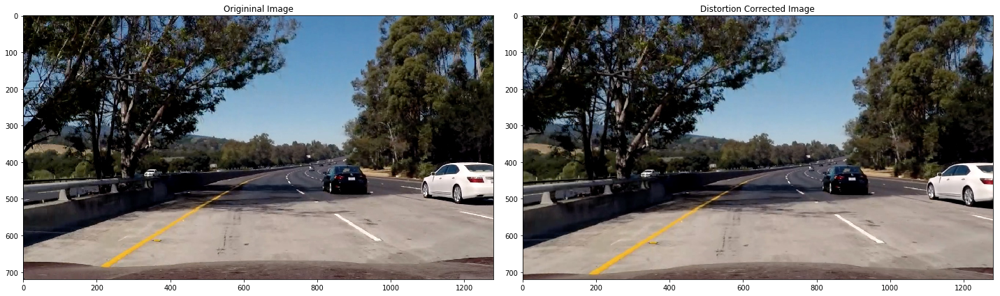

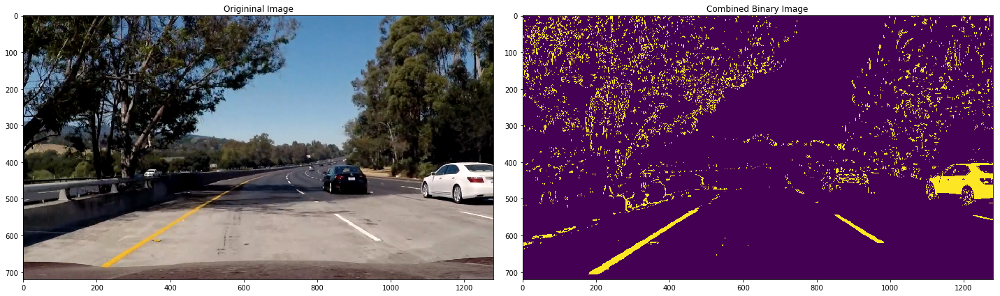

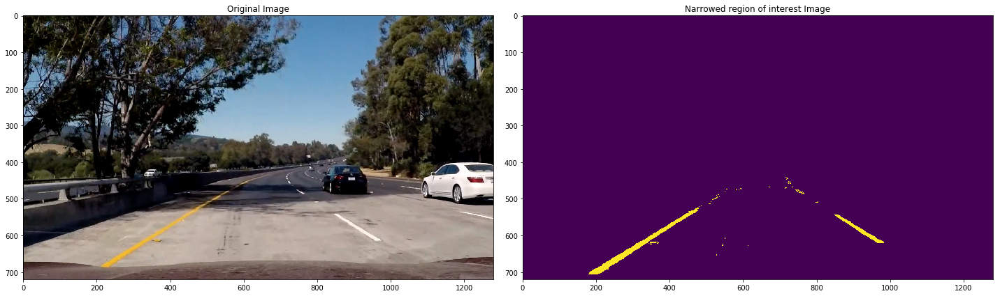

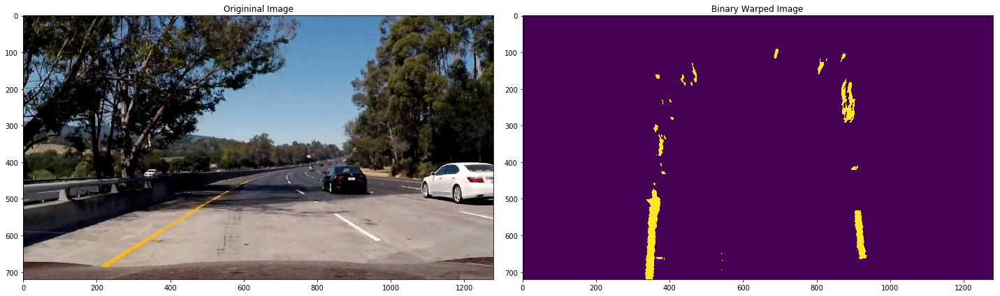

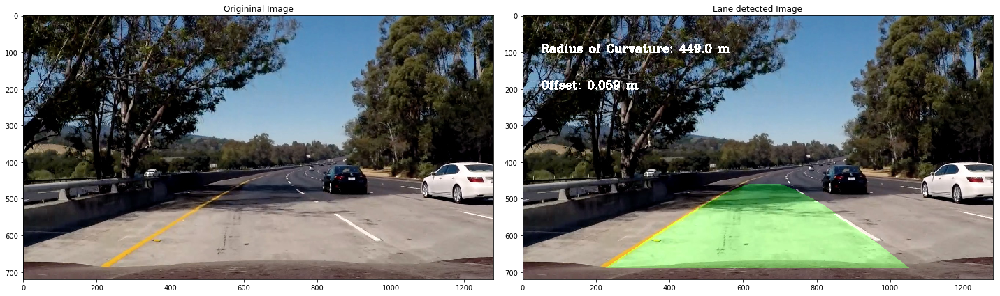

In [324]:
img = mpimg.imread('test_images/test5.jpg')
img_copy = np.copy(img)

# Apply a distortion correction to raw images.
distortion_corrected_img = cv2.undistort(img_copy, mtx, dist, None, mtx)

# Blur the image
blurred_img = blur_image(distortion_corrected_img)

# Use color transforms, gradients, etc., to create a thresholded binary image.
combined_binary_img = get_combined_binary_img(blurred_img)

# Narrow the image to a region of interest
vertices = np.array([[130, combined_binary.shape[0]], 
                     [625, combined_binary.shape[0]*0.6], 
                     [700, combined_binary.shape[0]*0.6], 
                     [1200, combined_binary.shape[0]]], np.int32)
roi_img = region_of_interest(combined_binary_img, [vertices])

# Apply a perspective transform to rectify binary image ("birds-eye view").
Minv, binary_warped = apply_perspective_transform(roi_img)

# Detect lane pixels and fit to find the lane boundary.
ploty, left_fit, right_fit, radius, offset = fit_polynomial(binary_warped)

# Warp the detected lane boundaries back onto the original image.
projected_lanes_img = draw(img_copy, binary_warped, left_fit, right_fit, Minv)

# Calculate radius and offset
out_img = add_calculations(projected_lanes_img, radius, offset)

plot_imgs(img, "Origininal Image", distortion_corrected_img, "Distortion Corrected Image")
plot_imgs(img, "Origininal Image", combined_binary_img, "Combined Binary Image")
plot_imgs(img, "Original Image", roi_img, "Narrowed region of interest Image")
plot_imgs(img, "Origininal Image", binary_warped, "Binary Warped Image")
plot_imgs(img, "Origininal Image", out_img, "Lane detected Image")

## Create lane tracking video pipeline

In [441]:
class PipelineVideo(object):
    def __init__(self):
        self.frame_ind = 0
        self.left_fit = None
        self.right_fit = None
        self.radius = None
        self.offset = None

In [511]:
def image_pipeline(img, pipeline):
    img_copy = np.copy(img)
    
    # Apply a distortion correction to raw images.
    distortion_corrected_img = cv2.undistort(img_copy, mtx, dist, None, mtx)

    # Use color transforms, gradients, etc., to create a thresholded binary image.
    combined_binary_img = get_combined_binary_img(distortion_corrected_img)
    
    # Narrow the image to a region of interest
    vertices = np.array([[150, combined_binary_img.shape[0]], 
                         [580, combined_binary_img.shape[0]*0.6], 
                         [745, combined_binary_img.shape[0]*0.6], 
                         [1150, combined_binary_img.shape[0]]], np.int32)
    roi_img = region_of_interest(combined_binary_img, [vertices])

    # Apply a perspective transform to rectify binary image ("birds-eye view").
    Minv, binary_warped = apply_perspective_transform(roi_img)

    # Detect lane pixels and fit to find the lane boundary.
    ploty, left_fit, right_fit, radius, offset = fit_polynomial(binary_warped)
    
    if pipeline.frame_ind == 0:
        pipeline.offset = offset
        pipeline.radius = radius
        
    # if the changes from the last frame are too great, use the fits from the previous frame
    if ((abs((offset[0]-pipeline.offset[0])/pipeline.offset[0]) > 0.5) |
        (pipeline.radius < 1000) & (abs((radius-pipeline.radius)/pipeline.radius) > 0.30) |
        ((pipeline.radius > 1000) & (abs((radius-pipeline.radius)/pipeline.radius) > 1))): # don't think this is necessary
        left_fit = pipeline.left_fit
        right_fit = pipeline.right_fit
        radius = pipeline.radius
        offset = pipeline.offset

    # Warp the detected lane boundaries back onto the original image.
    projected_lanes_img = draw(img_copy, binary_warped, left_fit, right_fit, Minv)

    # Calculate radius and offset
    out_img = add_calculations(projected_lanes_img, radius, offset)
    
    pipeline.frame_ind += 1
    pipeline.left_fit = left_fit
    pipeline.right_fit = right_fit
    pipeline.radius = radius
    pipeline.offset = offset

    return out_img

In [509]:
video_output = './output_video/lane_tracking.mp4'
pipeline = PipelineVideo()

video_clip = VideoFileClip("project_video.mp4")
clip = video_clip.fl_image(lambda x: image_pipeline(x, pipeline))
%time clip.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video ./output_video/lane_tracking.mp4
[MoviePy] Writing video ./output_video/lane_tracking.mp4






  0%|          | 0/1261 [00:00<?, ?it/s]



  0%|          | 1/1261 [00:00<02:14,  9.39it/s]



  0%|          | 2/1261 [00:00<02:15,  9.27it/s]



  0%|          | 3/1261 [00:00<02:14,  9.37it/s]



  0%|          | 4/1261 [00:00<02:13,  9.43it/s]



  0%|          | 5/1261 [00:00<02:16,  9.20it/s]



  0%|          | 6/1261 [00:00<02:13,  9.39it/s]



  1%|          | 7/1261 [00:00<02:15,  9.26it/s]



  1%|          | 8/1261 [00:00<02:13,  9.36it/s]



  1%|          | 9/1261 [00:00<02:15,  9.27it/s]



  1%|          | 10/1261 [00:01<02:14,  9.30it/s]



  1%|          | 11/1261 [00:01<02:13,  9.35it/s]



  1%|          | 12/1261 [00:01<02:12,  9.40it/s]



  1%|          | 13/1261 [00:01<02:15,  9.22it/s]



  1%|          | 14/1261 [00:01<02:12,  9.44it/s]



  1%|          | 15/1261 [00:01<02:10,  9.51it/s]



  1%|▏         | 16/1261 [00:01<02:10,  9.57it/s]



  1%|▏         | 17/1261 [00:01<02:09,  9.62it/s]



  1%|▏         | 18/1261 [00:01<02:07,  9.72it/s]



  2%|▏ 

 11%|█▏        | 144/1261 [00:15<02:10,  8.59it/s]



 11%|█▏        | 145/1261 [00:15<02:09,  8.61it/s]



 12%|█▏        | 146/1261 [00:15<02:13,  8.35it/s]



 12%|█▏        | 147/1261 [00:15<02:12,  8.43it/s]



 12%|█▏        | 148/1261 [00:16<02:11,  8.46it/s]



 12%|█▏        | 149/1261 [00:16<02:11,  8.46it/s]



 12%|█▏        | 150/1261 [00:16<02:10,  8.52it/s]



 12%|█▏        | 151/1261 [00:16<02:09,  8.56it/s]



 12%|█▏        | 152/1261 [00:16<02:10,  8.50it/s]



 12%|█▏        | 153/1261 [00:16<02:06,  8.75it/s]



 12%|█▏        | 154/1261 [00:16<02:05,  8.83it/s]



 12%|█▏        | 155/1261 [00:16<02:02,  9.04it/s]



 12%|█▏        | 156/1261 [00:17<02:02,  9.03it/s]



 12%|█▏        | 157/1261 [00:17<02:00,  9.17it/s]



 13%|█▎        | 158/1261 [00:17<01:58,  9.32it/s]



 13%|█▎        | 159/1261 [00:17<01:57,  9.39it/s]



 13%|█▎        | 160/1261 [00:17<02:02,  8.98it/s]



 13%|█▎        | 161/1261 [00:17<02:00,  9.12it/s]



 13%|█▎        | 162/1261 [0

 23%|██▎       | 289/1261 [00:31<01:38,  9.89it/s]



 23%|██▎       | 290/1261 [00:31<01:39,  9.76it/s]



 23%|██▎       | 292/1261 [00:31<01:38,  9.88it/s]



 23%|██▎       | 293/1261 [00:31<01:39,  9.74it/s]



 23%|██▎       | 294/1261 [00:31<01:38,  9.82it/s]



 23%|██▎       | 296/1261 [00:31<01:36, 10.03it/s]



 24%|██▎       | 298/1261 [00:32<01:35, 10.09it/s]



 24%|██▍       | 300/1261 [00:32<01:34, 10.13it/s]



 24%|██▍       | 302/1261 [00:32<01:34, 10.11it/s]



 24%|██▍       | 304/1261 [00:32<01:34, 10.12it/s]



 24%|██▍       | 306/1261 [00:32<01:35, 10.02it/s]



 24%|██▍       | 308/1261 [00:33<01:34, 10.12it/s]



 25%|██▍       | 310/1261 [00:33<01:34, 10.03it/s]



 25%|██▍       | 312/1261 [00:33<01:33, 10.11it/s]



 25%|██▍       | 314/1261 [00:33<01:34, 10.06it/s]



 25%|██▌       | 316/1261 [00:33<01:35,  9.93it/s]



 25%|██▌       | 318/1261 [00:34<01:33, 10.08it/s]



 25%|██▌       | 320/1261 [00:34<01:32, 10.21it/s]



 26%|██▌       | 322/1261 [0

 40%|███▉      | 502/1261 [00:52<01:14, 10.25it/s]



 40%|███▉      | 504/1261 [00:52<01:13, 10.35it/s]



 40%|████      | 506/1261 [00:52<01:13, 10.33it/s]



 40%|████      | 508/1261 [00:52<01:12, 10.41it/s]



 40%|████      | 510/1261 [00:53<01:12, 10.36it/s]



 41%|████      | 512/1261 [00:53<01:12, 10.39it/s]



 41%|████      | 514/1261 [00:53<01:11, 10.38it/s]



 41%|████      | 516/1261 [00:53<01:11, 10.46it/s]



 41%|████      | 518/1261 [00:53<01:11, 10.42it/s]



 41%|████      | 520/1261 [00:54<01:10, 10.52it/s]



 41%|████▏     | 522/1261 [00:54<01:10, 10.51it/s]



 42%|████▏     | 524/1261 [00:54<01:09, 10.58it/s]



 42%|████▏     | 526/1261 [00:54<01:09, 10.62it/s]



 42%|████▏     | 528/1261 [00:54<01:08, 10.65it/s]



 42%|████▏     | 530/1261 [00:54<01:08, 10.65it/s]



 42%|████▏     | 532/1261 [00:55<01:07, 10.75it/s]



 42%|████▏     | 534/1261 [00:55<01:07, 10.78it/s]



 43%|████▎     | 536/1261 [00:55<01:07, 10.77it/s]



 43%|████▎     | 538/1261 [0

 59%|█████▉    | 746/1261 [01:15<00:50, 10.28it/s]



 59%|█████▉    | 748/1261 [01:15<00:50, 10.21it/s]



 59%|█████▉    | 750/1261 [01:16<00:49, 10.32it/s]



 60%|█████▉    | 752/1261 [01:16<00:49, 10.36it/s]



 60%|█████▉    | 754/1261 [01:16<00:48, 10.36it/s]



 60%|█████▉    | 756/1261 [01:16<00:49, 10.18it/s]



 60%|██████    | 758/1261 [01:16<00:49, 10.23it/s]



 60%|██████    | 760/1261 [01:16<00:48, 10.41it/s]



 60%|██████    | 762/1261 [01:17<00:49, 10.17it/s]



 61%|██████    | 764/1261 [01:17<00:49, 10.04it/s]



 61%|██████    | 766/1261 [01:17<00:50,  9.82it/s]



 61%|██████    | 767/1261 [01:17<00:51,  9.62it/s]



 61%|██████    | 768/1261 [01:17<00:52,  9.32it/s]



 61%|██████    | 770/1261 [01:18<00:51,  9.48it/s]



 61%|██████    | 771/1261 [01:18<00:51,  9.53it/s]



 61%|██████    | 772/1261 [01:18<00:50,  9.59it/s]



 61%|██████▏   | 773/1261 [01:18<00:51,  9.41it/s]



 61%|██████▏   | 774/1261 [01:18<00:54,  8.87it/s]



 61%|██████▏   | 775/1261 [0

 74%|███████▎  | 928/1261 [01:34<00:33, 10.09it/s]



 74%|███████▍  | 930/1261 [01:34<00:33,  9.92it/s]



 74%|███████▍  | 931/1261 [01:34<00:33,  9.85it/s]



 74%|███████▍  | 932/1261 [01:34<00:34,  9.66it/s]



 74%|███████▍  | 933/1261 [01:34<00:33,  9.69it/s]



 74%|███████▍  | 934/1261 [01:34<00:34,  9.42it/s]



 74%|███████▍  | 935/1261 [01:34<00:34,  9.44it/s]



 74%|███████▍  | 936/1261 [01:35<00:34,  9.48it/s]



 74%|███████▍  | 937/1261 [01:35<00:34,  9.49it/s]



 74%|███████▍  | 938/1261 [01:35<00:33,  9.51it/s]



 75%|███████▍  | 940/1261 [01:35<00:32,  9.78it/s]



 75%|███████▍  | 941/1261 [01:35<00:32,  9.82it/s]



 75%|███████▍  | 942/1261 [01:35<00:32,  9.87it/s]



 75%|███████▍  | 944/1261 [01:35<00:31, 10.08it/s]



 75%|███████▌  | 946/1261 [01:36<00:30, 10.17it/s]



 75%|███████▌  | 948/1261 [01:36<00:30, 10.20it/s]



 75%|███████▌  | 950/1261 [01:36<00:30, 10.08it/s]



 75%|███████▌  | 952/1261 [01:36<00:30, 10.01it/s]



 76%|███████▌  | 954/1261 [0

 86%|████████▋ | 1088/1261 [01:50<00:17, 10.13it/s]



 86%|████████▋ | 1090/1261 [01:51<00:16, 10.11it/s]



 87%|████████▋ | 1092/1261 [01:51<00:16,  9.98it/s]



 87%|████████▋ | 1094/1261 [01:51<00:16, 10.04it/s]



 87%|████████▋ | 1096/1261 [01:51<00:16, 10.15it/s]



 87%|████████▋ | 1098/1261 [01:51<00:15, 10.23it/s]



 87%|████████▋ | 1100/1261 [01:52<00:15, 10.25it/s]



 87%|████████▋ | 1102/1261 [01:52<00:15, 10.15it/s]



 88%|████████▊ | 1104/1261 [01:52<00:15, 10.04it/s]



 88%|████████▊ | 1106/1261 [01:52<00:15,  9.90it/s]



 88%|████████▊ | 1107/1261 [01:52<00:15,  9.81it/s]



 88%|████████▊ | 1109/1261 [01:53<00:15,  9.95it/s]



 88%|████████▊ | 1110/1261 [01:53<00:15,  9.88it/s]



 88%|████████▊ | 1112/1261 [01:53<00:14, 10.06it/s]



 88%|████████▊ | 1114/1261 [01:53<00:14,  9.94it/s]



 88%|████████▊ | 1115/1261 [01:53<00:14,  9.82it/s]



 89%|████████▊ | 1116/1261 [01:53<00:14,  9.73it/s]



 89%|████████▊ | 1117/1261 [01:53<00:14,  9.81it/s]



 89%|█████

 98%|█████████▊| 1230/1261 [02:06<00:03,  8.76it/s]



 98%|█████████▊| 1231/1261 [02:06<00:03,  8.92it/s]



 98%|█████████▊| 1232/1261 [02:06<00:03,  9.12it/s]



 98%|█████████▊| 1233/1261 [02:07<00:03,  9.20it/s]



 98%|█████████▊| 1234/1261 [02:07<00:02,  9.01it/s]



 98%|█████████▊| 1235/1261 [02:07<00:02,  8.80it/s]



 98%|█████████▊| 1236/1261 [02:07<00:02,  8.85it/s]



 98%|█████████▊| 1237/1261 [02:07<00:02,  8.97it/s]



 98%|█████████▊| 1238/1261 [02:07<00:02,  9.16it/s]



 98%|█████████▊| 1239/1261 [02:07<00:02,  9.23it/s]



 98%|█████████▊| 1240/1261 [02:07<00:02,  9.30it/s]



 98%|█████████▊| 1241/1261 [02:07<00:02,  9.27it/s]



 98%|█████████▊| 1242/1261 [02:08<00:02,  9.05it/s]



 99%|█████████▊| 1243/1261 [02:08<00:02,  8.94it/s]



 99%|█████████▊| 1244/1261 [02:08<00:01,  8.81it/s]



 99%|█████████▊| 1245/1261 [02:08<00:01,  8.81it/s]



 99%|█████████▉| 1246/1261 [02:08<00:01,  9.02it/s]



 99%|█████████▉| 1247/1261 [02:08<00:01,  9.02it/s]



 99%|█████

[MoviePy] Done.
[MoviePy] >>>> Video ready: ./output_video/lane_tracking.mp4 

CPU times: user 2min 38s, sys: 32.7 s, total: 3min 11s
Wall time: 2min 10s


In [510]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_output))